<a href="https://colab.research.google.com/github/Kapernikov/workshop-face-and-plate-recognition/blob/main/Copy_of_workshop_face_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# dependencies 

In [11]:
!git clone https://github.com/Kapernikov/workshop-face-and-plate-recognition.git

Cloning into 'workshop-face-and-plate-recognition'...
remote: Enumerating objects: 15, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 15 (delta 2), reused 8 (delta 0), pack-reused 0
Unpacking objects: 100% (15/15), 9.68 MiB | 7.18 MiB/s, done.


In [12]:
!cd workshop-face-and-plate-recognition/ ; git pull

Already up to date.


In [13]:
!pip install -r workshop-face-and-plate-recognition/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 39.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.8/61.8 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 KB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 KB 9.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.6.0.66
    Uninstalling opencv-python-4.6.0.66:
      Successfully uninstalled opencv-python-4.6.0.66


In [1]:
import cv2
import onnxruntime as ort
import numpy as np

# pre process 

In [27]:
def preprocess_for_face_detection(frame):
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (640, 480))
    from google.colab.patches import cv2_imshow
    cv2_imshow(img)

    img = (img - np.array([127, 127, 127])) / 128
    img = np.transpose(img, [2, 0, 1])
    img = np.expand_dims(img, axis=0)
    img = img.astype(np.float32)

    return img

In [28]:
def preprocess_for_plate_detection(frame):
    IN_IMAGE_H = ort_session_plate_model.get_inputs()[0].shape[2]
    IN_IMAGE_W = ort_session_plate_model.get_inputs()[0].shape[3]

    # Input
    resized = cv2.resize(frame, (IN_IMAGE_W, IN_IMAGE_H), interpolation=cv2.INTER_LINEAR)
    img_in = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
    from google.colab.patches import cv2_imshow
    cv2_imshow(img_in)
    img_in = np.transpose(img_in, (2, 0, 1)).astype(np.float32)
    img_in = np.expand_dims(img_in, axis=0)
    img_in /= 255.0
    return img_in

# run the model

Load the models

In [4]:
ort_session_face_model = ort.InferenceSession("""workshop-face-and-plate-recognition//models//ultra_light_640.onnx""")
input_name_face_model = ort_session_face_model.get_inputs()[0].name

In [5]:
def predict_face_area(input_data):
    confidences, boxes = ort_session_face_model.run(None, {input_name_face_model: input_data})
    return confidences, boxes

In [ ]:
! wget -c https://drive.google.com/file/d/16NPM0SGP-p6R3VNb9eB6rqM7-E2-EjKX/view?usp=share_link -O workshop-face-and-plate-recognition/models/yolov4_1_3_416_416_static.onnx

--2023-03-20 13:13:28--  https://drive.google.com/file/d/1azNd843fOQebNQaoBPB8e6gzopWu-IFn/view?usp=share_link
Resolving drive.google.com (drive.google.com)... 108.177.119.138, 108.177.119.101, 108.177.119.100, ...
Connecting to drive.google.com (drive.google.com)|108.177.119.138|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘workshop-face-and-plate-recognition/models/yolov4_1_3_416_416_static.onnx’

workshop-face-and-p     [ <=>                ]  72.17K  --.-KB/s    in 0.01s   

2023-03-20 13:13:28 (6.22 MB/s) - ‘workshop-face-and-plate-recognition/models/yolov4_1_3_416_416_static.onnx’ saved [73906]



In [6]:
ort_session_plate_model = ort.InferenceSession("""/content/drive/MyDrive/onnx_model/yolov4_1_3_416_416_static.onnx""")
#ort_session_plate_model = ort.InferenceSession("""yolov4_1_3_416_416_static.onnx""")
input_name_plate_model = ort_session_plate_model.get_inputs()[0].name

In [7]:
def predict_plate(input_data):
    boxes, confidences = ort_session_plate_model.run(None, {input_name_plate_model: input_data})
    return confidences, boxes[:,:,0,:]

# post process

In [8]:
def get_area_of(left_top, right_bottom):
    hw = np.clip(right_bottom - left_top, 0.0, None)
    return hw[..., 0] * hw[..., 1]

In [9]:
def get_iou_of(boxes0, boxes1):
    overlap_left_top = np.maximum(boxes0[..., :2], boxes1[..., :2])
    overlap_right_bottom = np.minimum(boxes0[..., 2:], boxes1[..., 2:])

    overlap_area = get_area_of(overlap_left_top, overlap_right_bottom)
    area0 = get_area_of(boxes0[..., :2], boxes0[..., 2:])
    area1 = get_area_of(boxes1[..., :2], boxes1[..., 2:])
    return overlap_area / (area0 + area1 - overlap_area + 1e-5)

In [10]:
def proceed_hard_nms(box_scores, iou_threshold, top_k=-1, candidate_size=200):
    scores = box_scores[:, -1]
    boxes = box_scores[:, :-1]
    picked = []
    indexes = np.argsort(scores)
    indexes = indexes[-candidate_size:]
    while len(indexes) > 0:
        current = indexes[-1]
        picked.append(current)
        if 0 < top_k == len(picked) or len(indexes) == 1:
            break
        current_box = boxes[current, :]
        indexes = indexes[:-1]
        rest_boxes = boxes[indexes, :]
        iou = get_iou_of(
            rest_boxes,
            np.expand_dims(current_box, axis=0),
        )
        indexes = indexes[iou <= iou_threshold]

    return box_scores[picked, :]

In [11]:
def postprocess_face_area(width, height, confidences, boxes, prob_threshold, iou_threshold=0.5, top_k=-1, skip_n_class=0):
    boxes = boxes[0]
    confidences = confidences[0]
    picked_box_probs = []
    picked_labels = []
    for class_index in range(skip_n_class, confidences.shape[1]):
        probs = confidences[:, class_index]
        mask = probs > prob_threshold
        probs = probs[mask]
        if probs.shape[0] == 0:
            continue
        subset_boxes = boxes[mask, :]
        box_probs = np.concatenate([subset_boxes, probs.reshape(-1, 1)], axis=1)
        box_probs = proceed_hard_nms(box_probs,
           iou_threshold=iou_threshold,
           top_k=top_k,
           )
        picked_box_probs.append(box_probs)
        picked_labels.extend([class_index] * box_probs.shape[0])
    if not picked_box_probs:
        return np.array([]), np.array([]), np.array([])
    picked_box_probs = np.concatenate(picked_box_probs)
    picked_box_probs[:, 0] *= width
    picked_box_probs[:, 1] *= height
    picked_box_probs[:, 2] *= width
    picked_box_probs[:, 3] *= height
    return picked_box_probs[:, :4].astype(np.int32), np.array(picked_labels), picked_box_probs[:, 4]

# Process zone of interest

In [12]:
def blur_box(frame, box):
    h, w, _ = frame.shape
    x1, y1, x2, y2 = box

    roi_buffer = max((x2-x1), (y2-y1))//4
    x1_buffered = max(0, x1-roi_buffer)
    y1_buffered = max(0, y1-roi_buffer)
    x2_buffered = min(w, x2+roi_buffer)
    y2_buffered = min(h, y2+roi_buffer)

    roi = frame[y1_buffered:y2_buffered, x1_buffered:x2_buffered]
    roi = cv2.resize(roi, (8, 8), interpolation=cv2.INTER_NEAREST)
    roi = cv2.resize(roi, (x2_buffered-x1_buffered, y2_buffered-y1_buffered), interpolation=cv2.INTER_NEAREST)
    frame[y1_buffered:y2_buffered, x1_buffered:x2_buffered] = roi

In [13]:
def draw_box(frame, box, label):
    h, w, _ = frame.shape
    x1, y1, x2, y2 = box

    roi_buffer = max((x2-x1), (y2-y1))//4
    x1_buffered = max(0, x1-roi_buffer)
    y1_buffered = max(0, y1-roi_buffer)
    x2_buffered = min(w, x2+roi_buffer)
    y2_buffered = min(h, y2+roi_buffer)

    cv2.rectangle(frame, (x1, y1), (x2, y2), (80,18,236), 2)
    cv2.rectangle(frame, (x1, y2 - 20), (x2, y2), (80,18,236), cv2.FILLED)
    font = cv2.FONT_HERSHEY_DUPLEX
    text = f"face: {label}"
    cv2.putText(frame, text, (x1 + 6, y2 - 6), font, 0.5, (255, 255, 255), 1)

# Glue all together

In [14]:
!wget -c https://media.wired.com/photos/5926f91dcfe0d93c47431f76/master/w_1600%2Cc_limit/Top-Gear-Series-23-Preview_11_35MB.jpg -O image_test.jpg

--2023-03-20 14:20:59--  https://media.wired.com/photos/5926f91dcfe0d93c47431f76/master/w_1600%2Cc_limit/Top-Gear-Series-23-Preview_11_35MB.jpg
Resolving media.wired.com (media.wired.com)... 151.101.0.239, 151.101.64.239, 151.101.128.239, ...
Connecting to media.wired.com (media.wired.com)|151.101.0.239|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 469553 (459K) [image/jpeg]
Saving to: ‘image_test.jpg’

image_test.jpg      100%[===================>] 458.55K  --.-KB/s    in 0.04s   

2023-03-20 14:20:59 (10.3 MB/s) - ‘image_test.jpg’ saved [469553/469553]



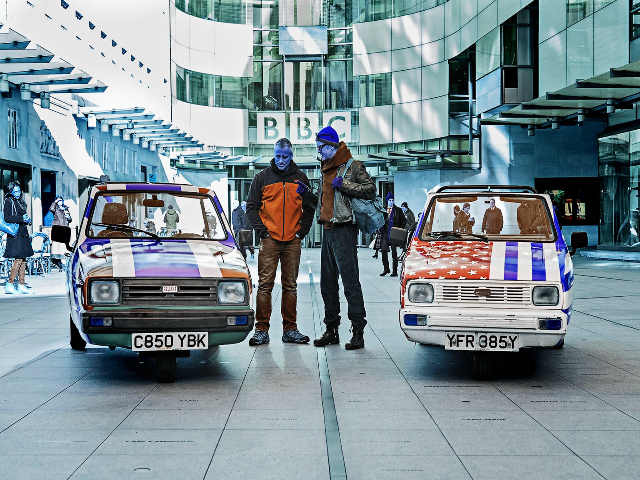

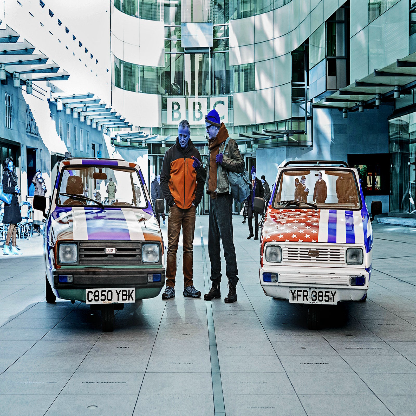

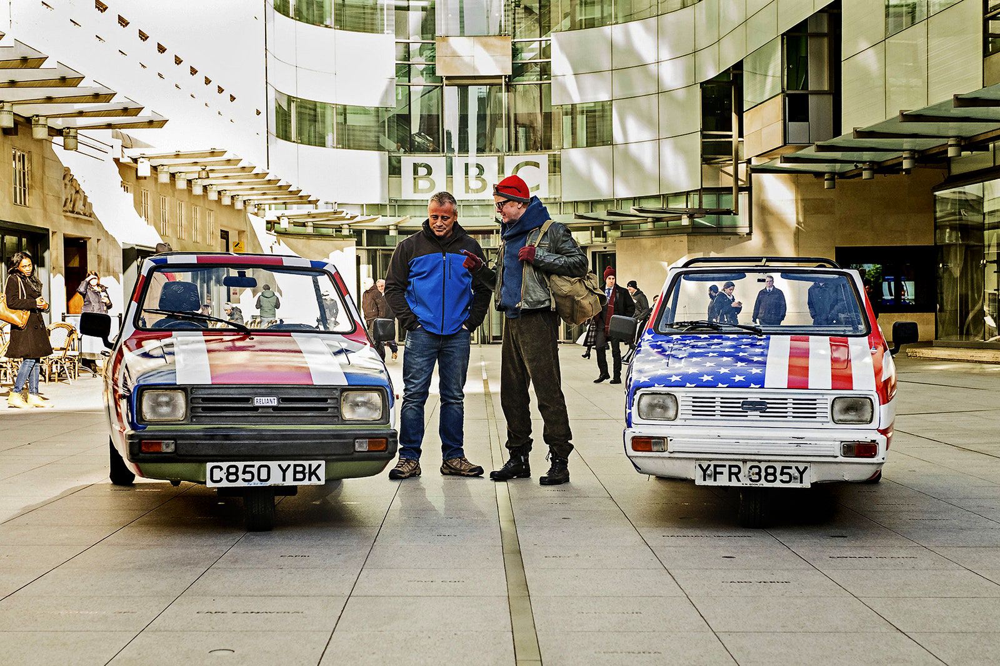

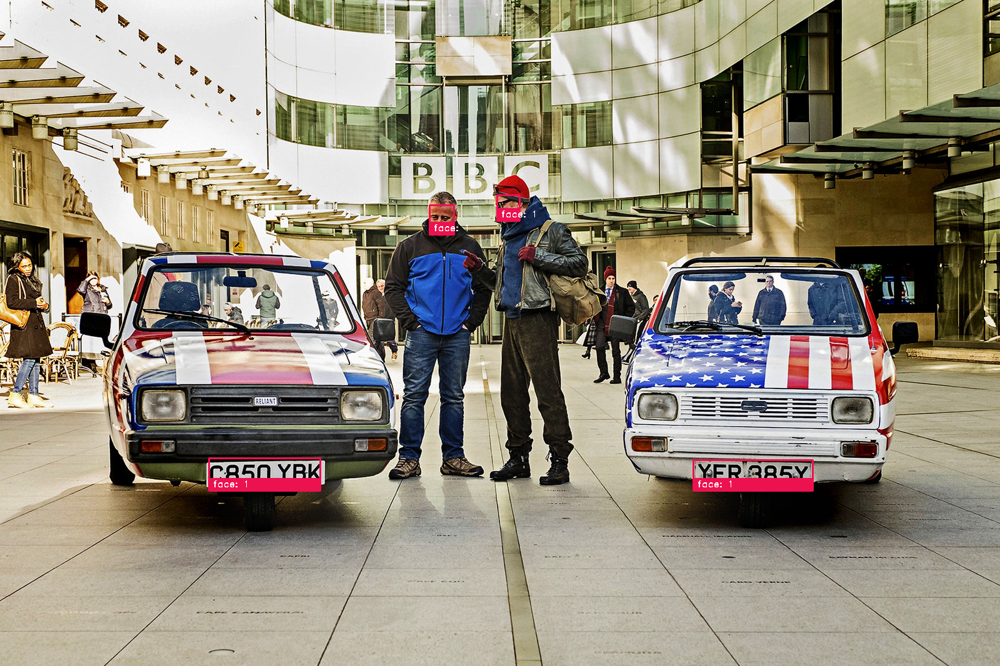

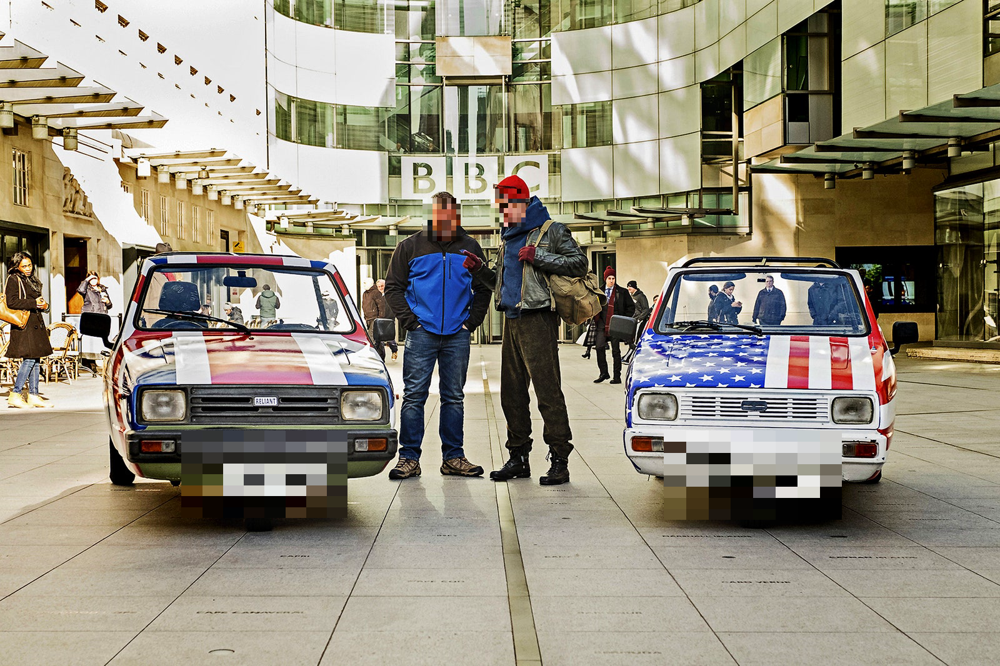

In [29]:
file_name = "image_test.jpg"
video_capture = cv2.VideoCapture(file_name)

ret, frame = video_capture.read()

input_data = preprocess_for_face_detection(frame)
input_data_plate = preprocess_for_plate_detection(frame)

confidences_face, boxes_face = predict_face_area(input_data)
confidences_plate, boxes_plate = predict_plate(input_data_plate)

boxes = np.concatenate((boxes_face, boxes_plate), axis=1)
confidences = np.concatenate((np.insert(confidences_face, 2, 0, axis=2), np.insert(confidences_plate, (0,1), 0, axis=2)), axis=1)

h, w, _ = frame.shape
boxes, labels, probs = postprocess_face_area(w, h, confidences, boxes, 0.5, skip_n_class=1)

frame_result_1 = np.array(frame)
frame_result_2 = np.array(frame)

for i in range(boxes.shape[0]):
    box = boxes[i, :]
    blur_box(frame_result_2, box)
    draw_box(frame_result_1, box, labels[i])

# cv2.imshow('Image', frame)
from google.colab.patches import cv2_imshow
cv2_imshow(frame)
cv2_imshow(frame_result_1)
cv2_imshow(frame_result_2)

video_capture.release()
cv2.destroyAllWindows()